### Summery
<pre>
Author           : Anjana Tiha
Project Name     : "Image Recognition using Deep Convolutional Neural Network (Monkey Dataset)"
Description      : 1. Developed image recognition tool using Deep Convolutional Neural Network built 
                      from scratch with Keras Sequential model and, pretrained model “Inception” separately 
                      for fine-tuning with new class labels.
                   2. Trained on dataset - 10 Monkey species dataset (accuracy (validation-100%, testing-98.53%)).
Method           : 
Tools/Library    : Python, Keras, PyTorch, TensorFlow
Version History  : 1.0.0.0
Current Version  : 1.0.0.2
Last Update      : 12.18.2018
Comments         : Please use Anaconda editor for convenience.
</pre>

#### Code
<pre>
GitHub Link      : <a href=https://github.com/anjanatiha/Image-Recognition-using-Deep-Convolutional-Neural-Network>Image Recognition using Deep Convolutional Neural Network (Monkey Dataset) (GitHub)</a>
GitLab Link      : <a href=https://gitlab.com/anjanatiha/Image-Recognition-using-Deep-Convolutional-Neural-Network>Image Recognition using Deep Convolutional Neural Network (Monkey Dataset) (GitLab)</a>
Portfolio        : <a href=https://anjanatiha.wixsite.com/website>Anjana Tiha's Portfolio</a>
</pre>

#### Dataset

<pre>
Dataset Name     : 10 Monkey Species
Dataset Link     : <a href=https://www.kaggle.com/slothkong/10-monkey-species>10 Monkey Species</a>
</pre>

<!---
#### Library/Tools Version
- Python - v3.6.7
- argparse
- random
- numpy
- shutil
- gc
- re
- Keras - 2.2.4
- Keras-preprocessing - v1.0.5
- TensorFlow - 1.12
- PIL/Pillow - 5.1.0
- Matplotlib - 2.2.2
- scikit-learn - 0.19.1
- mlxtend - 0.14.0
-->

#### Commands / Running Instruction
<pre>
tensorboard --logdir=logs
%config IPCompleter.greedy=True
</pre>

<pre>
<b>Dataset Details</b>
Dataset Name            : Flower Dataset
Number of Class         : 5
Number/Size of Images   : Total      : 4327 (228 Megabyte  (MB))
                          Training   : 3031 (158 Megabyte  (MB))
                          Validation : 866  (51.8 Megabyte (MB))
                          Testing    : 426  (26.6 Megabyte (MB)) 

<b>Model Parameters</b>
Machine Learning Library: Keras
Base Model              : InceptionV3
Optimizers              : Adam
Loss Function           : categorical_crossentropy

<b>Training Parameters</b>
Batch Size              : 64
Number of Epochs        : 50
Training Time           : 40 min

<b>Output (Prediction/ Recognition / Classification Metrics)</b>
<b>Validation</b>
Accuracy                : 98%
Loss                    : 0.06 

<b>Testing</b>
Accuracy                : 98.53%
Loss                    : 0.03 
<!--Precision               : 
Recall                  : 
-->

</pre>

<!--
Best Model : data\output\models\13-val_acc-0.98-val_loss-0.04.hdf5
Accuracy                : 98.53%
Loss                    : 0.03 
Precision               : 
Recall                  : 
-->

### Detailed Performance Report
<pre>
Summary
------------------------------------------------------------------------------------------
Loss     : 0.03  
Accuracy : 98.53%
    
------------------------------------------------------------------------------------------
Derived Report
------------------------------------------------------------------------------------------
Precision     : 80.94%
Recall        : 80.88%
F1-Score      : 80.88%
------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------
Report for Model File:  2018-12-18 02-49-37/{epoch:02d}-val_acc-{val_acc:.2f}-val_loss-{val_loss:.2f}.hdf5
------------------------------------------------------------------------------------------
                           precision    recall  f1-score   support

           Mantled Howler       0.78      0.81      0.79        26
             Patas Monkey       0.82      0.82      0.82        28
              Bald Uakari       0.81      0.81      0.81        27
         Japanese Macaque       0.83      0.83      0.83        30
           Pygmy Marmoset       0.80      0.77      0.78        26
    White Headed Capuchin       0.81      0.75      0.78        28
         Silvery Marmoset       0.81      0.81      0.81        26
   Common Squirrel Monkey       0.83      0.86      0.84        28
Black Headed Night Monkey       0.85      0.81      0.83        27
           Nilgiri Langur       0.75      0.81      0.78        26

                micro avg       0.81      0.81      0.81       272
                macro avg       0.81      0.81      0.81       272
             weighted avg       0.81      0.81      0.81       272

------------------------------------------------------------------------------------------

</pre>

## Import Libraries

In [30]:
import sys
import os
import argparse

import random

import time
import datetime

from collections import Counter

import numpy as np
import pandas as pd

import shutil
from tqdm import tqdm

import inspect
import gc

import re

from PIL import Image
import cv2

import keras

from keras.utils import np_utils

from keras.preprocessing.image import ImageDataGenerator

from keras import models
from keras.models import Model
from keras.models import Sequential
from keras.layers import Conv2D, Activation, MaxPooling2D, Dropout, GlobalAveragePooling1D, GlobalAveragePooling2D, Flatten, BatchNormalization, Dense


from keras.applications.inception_v3 import InceptionV3


from keras.constraints import maxnorm


from keras import optimizers
from keras.optimizers import Adam, SGD , RMSprop


from keras import backend as K
# K.set_image_dim_ordering('th')


from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau

from keras.wrappers.scikit_learn import KerasClassifier


from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report


from mlxtend.plotting import plot_confusion_matrix

import tensorflow as tf



from IPython.display import display

import seaborn as sns

from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

In [31]:
# Creates directory, if directory exists removes if remove parameter is set to True 
def create_directory(directory_path, remove=False):
    if remove and os.path.exists(directory_path):
        try:
            shutil.rmtree(directory_path)
            os.mkdir(directory_path)
        except:
            print("Could not remove directory : ", directory_path)
            return False
    else:
        try:
            os.mkdir(directory_path)
        except:
            print("Could not create directory: ", directory_path)
            return False
        
    return True


# Removes directory, if directory exists 
def remove_directory(directory_path):
    if os.path.exists(directory_path):
        try:
            shutil.rmtree(directory_path)
        except:
            print("Could not remove directory : ", directory_path)
            return False
        
    return True


def clear_directory(directory_path):
    dirs_files = os.listdir(directory_path)
    
    for item in dirs_files:
#         item_path = os.path.join(directory_path, item)
        item_path = directory_path+ item
        
        try:
            if os.path.isfile(item_path):
                os.unlink(item_path)
            elif os.path.isdir(item_path): 
                shutil.rmtree(item_path)
        except Exception as e:
            print(e)
            
    return True


def remove_empty_folders(path, removeRoot=True):
    if not os.path.isdir(path):
        return
    
    # remove empty subfolders
    files = os.listdir(path)
    
    if len(files):
        for f in files:
            fullpath = os.path.join(path, f)
            
            if os.path.isdir(fullpath):
                remove_empty_folders(fullpath)

    # if folder empty, delete it
    files = os.listdir(path)
    
    if len(files) == 0 and removeRoot:
        print("Removing empty folder:", path)
        os.rmdir(path)
        
        
def dir_file_count(directory):
    return sum([len(files) for r, d, files in os.walk(directory)])

In [32]:
# print date and time for given type of representation
def date_time(x):
    if x==1:
        return 'Timestamp: {:%Y-%m-%d %H:%M:%S}'.format(datetime.datetime.now())
    if x==2:    
        return 'Timestamp: {:%Y-%b-%d %H:%M:%S}'.format(datetime.datetime.now())
    if x==3:  
        return 'Date now: %s' % datetime.datetime.now()
    if x==4:  
        return 'Date today: %s' % datetime.date.today()  

In [33]:
# prints a integer for degugging
def debug(x):
    print("-"*40, x, "-"*40)  

In [34]:
# Removes everything except alphabetical and selected characters from name string
def name_correct(name):
    return re.sub(r'[^a-zA-Z,:]', ' ', name).title()

### Data Visualization Function

In [35]:
def get_reset_subplot_params(nrows, ncols, dpi):
    subplot_params = {}
    subplot_params["nrows"] = nrows
    subplot_params["ncols"] = ncols

    subplot_params["figsize_col"] = subplot_params["ncols"]*2.5
    subplot_params["figsize_row"] = subplot_params["nrows"]*2.5
    
    subplot_params["facecolor"] = 'w'
    subplot_params["edgecolor"] = 'k'

    subplot_params["axes.titlesize"] = 'small'
    
    subplot_params["hspace"] = 0.5
    subplot_params["wspace"] = 0.3
    
    subplot_params["subplot_kw"] = {'xticks': [], 'yticks': []}
    
    subplot_params["dpi"] = dpi
    
    return subplot_params

def get_reset_plot_params(figsize=(15, 5), title="", xlabel ="", ylabel="", legends=[], title_fontsize = 18, label_fontsize = 14, image_file_name="", save = False, dpi=100, update_image=True):
    plot_params = {}
    
    plot_params["figsize"] = figsize
    
    plot_params["title"] = title
    
    plot_params["xlabel"] = xlabel
    plot_params["ylabel"] = ylabel
    
    plot_params["legends"] = legends 
    
    plot_params["title_fontsize"] = title_fontsize
    plot_params["axes.titlesize"] = "small"
    plot_params["label_fontsize"] = label_fontsize
    
    plot_params["image_file_name"] = image_file_name
    plot_params["save"] = save
    plot_params["update_image"] = update_image
    
    plot_params["subplot"] = None
    
    return plot_params

In [36]:
def select_image_by_category(image_dir, image_count_per_category):
    classes = os.listdir(image_dir)
    class_count = len(classes)

    image_file_paths = {}
    
    for i in range(class_count):
        subdir_path = image_dir+"/"+classes[i]
        subdir_files = os.listdir(subdir_path)

        subdir_file_count = len(subdir_files)

        subdir_file_mem = {}
        
        subdir_file_index = -1
        
        image_file_paths[classes[i]] = []
        
        for j in range(image_count_per_category):
            while subdir_file_index in subdir_file_mem:
                subdir_file_index = random.randint(0, subdir_file_count-1)
                
            subdir_file_mem[subdir_file_index] = 1
            
            subdir_file_name = subdir_files[subdir_file_index]
            subdir_file_path = subdir_path+ "/" + subdir_file_name

            image_file_paths[classes[i]].append(subdir_file_path)
            
    return image_file_paths


def get_fig_axs(subplot_params):
    fig, axs = plt.subplots(
        nrows=subplot_params["nrows"], ncols=subplot_params["ncols"], 
        figsize=(subplot_params["figsize_col"], subplot_params["figsize_row"]),
        dpi=subplot_params["dpi"], facecolor=subplot_params["facecolor"], 
        edgecolor=subplot_params["edgecolor"], subplot_kw=subplot_params["subplot_kw"])
        
    return fig, axs
    

def plot_sample_image(image_file_paths, plot_params, subplot_params, update_image=True):
    fig, axs = get_fig_axs(subplot_params)

    plt.rcParams.update({'axes.titlesize': plot_params["axes.titlesize"]})
    plt.subplots_adjust(hspace=subplot_params["hspace"], wspace=subplot_params["wspace"])

    i=0
    for image_file_path in image_file_paths:
        img = plt.imread(image_file_path)   
        
        plt.subplot(subplot_params["nrows"], subplot_params["ncols"], i+1)
        plt.title(image_file_path.split("/")[-1])
        plt.imshow(img, aspect='auto')
        
        plt.xticks([])
        plt.yticks([])
        
        i=i+1
        
    if plot_params["update_image"] and os.path.exists(plot_params["image_file_name"]):
        os.remove(plot_params["image_file_name"])  
    if plot_params["save"]:
        fig.savefig(plot_params["image_file_name"], dpi=plot_params["dpi"])
        
    plt.tight_layout()
    plt.show()
    
    
def show_class_sample_images(directory, image_count_per_category=5, save=False, dpi=100, update_image=False, name_map=None):
    class_count = len(os.listdir(directory))
    print("Number of Class: ", class_count)
    
    sample_img_by_class = select_image_by_category(directory, image_count_per_category)
    
    for class_name in sample_img_by_class:
        plot_params = get_reset_plot_params(image_file_name="img.png", save = save, dpi=dpi, update_image=update_image)
        subplot_params = get_reset_subplot_params(nrows=1, ncols=image_count_per_category, dpi=dpi)
        
        if name_map:
            print("%s%s%s"%("-"*55, name_correct(name_map[class_name]), "-"*55))
        else:
            print("%s%s%s"%("-"*55, name_correct(class_name), "-"*55))
        
        plot_sample_image(sample_img_by_class[class_name], plot_params, subplot_params)
        
        print("")
        
    print("%s%s%d%s"%("-"*55, "All Class Printed:", class_count, "-"*55))

In [37]:
# count number of files in each subdirectory of a directory
def subdirectory_file_count(master_directory):
    subdirectories = os.listdir(master_directory)
    subdirectory_count = len(subdirectories)

    subdirectory_names = []
    subdirectory_file_counts = []

    for subdirectory in subdirectories:
        current_directory = os.path.join(master_directory, subdirectory)
        file_count = len(os.listdir(current_directory))
        subdirectory_names.append(subdirectory)
        subdirectory_file_counts.append(file_count)
    
    return subdirectory_names, subdirectory_file_counts
         
    

# show barplot
def bar_plot(x, y, plot_params):
    if plot_params['subplot']:
        plt.subplot(plot_params['subplot'])
        
    sns_bar = sns.barplot(x=x, y=y)
    plt.setp(sns_bar.get_xticklabels(), rotation=90)
    
    plt.title(plot_params['title'], fontsize=plot_params['title_fontsize'])
    
    plt.xlabel(plot_params['xlabel'], fontsize=plot_params['label_fontsize'])
    plt.ylabel(plot_params['ylabel'], fontsize=plot_params['label_fontsize'])
    
    plt.xticks(range(len(x)), x)
    
# show bar plot for count of labels in subdirectory of a directory
def count_bar_plot(master_directory, plot_params, name_map=None):
    dir_name, dir_file_count = subdirectory_file_count(master_directory)
    
    if name_map:
        x = [name_correct(name_map[i]) for i in dir_name]
    else:
        x = [name_correct(i) for i in dir_name]
    
    # x = dir_name
    y = dir_file_count
    
    bar_plot(x, y, plot_params)
    
    
# show bar plot for count of labels in subdirectory of a training, validation, testing directory    
def show_train_val_test(training_dir, validation_dir=None, testing_dir=None, plot_params=None, name_map=None):
    plt.figure(figsize=plot_params['figsize'])
    
    title = plot_params['title']
    plot_params['title'] = title + " (Training)"
    subplot_no = plot_params['subplot'] 

    count_bar_plot(training_dir, plot_params, name_map=name_map)
    
    if validation_dir:
        plot_params['title'] = title + " (Validation)"
        plot_params['subplot'] = subplot_no+1
        count_bar_plot(validation_dir, plot_params, name_map=name_map)
    
    if testing_dir:
        plot_params['title'] = title + " (Testing)"
        plot_params['subplot'] = subplot_no + 2
        count_bar_plot(testing_dir, plot_params, name_map=name_map)
    
    plt.show()

In [38]:
# reset tensorflow graph tp free up memory and resource allocation 
def reset_graph(model=None):
    if model:
        try:
            del model
        except:
            return False
    
    tf.reset_default_graph()
    
    K.clear_session()
    
    gc.collect()
    
    return True


# reset callbacks 
def reset_callbacks(checkpoint=None, reduce_lr=None, early_stopping=None, tensorboard=None):
    checkpoint = None
    reduce_lr = None
    early_stopping = None
    tensorboard = None
    

### Preprocessing

In [39]:
reset_graph()
reset_callbacks()

In [40]:
# Configure input/ output directory
# Configure training, validation, testing directory

input_directory = r"data/input/"
output_directory = r"data/output/"

training_dir = input_directory + r"training"
# validation_dir = input_directory + r"validation"
# testing_dir = input_directory + r"testing"
#--------------------------------------------------------#
# no test data so use validation data as test data
testing_dir = input_directory + r"validation"
#--------------------------------------------------------#

figure_directory = "data/output/figures"
if not os.path.exists(figure_directory):
    os.mkdir(figure_directory)
    
    
file_name_pred_batch = figure_directory+r"/result"
file_name_pred_sample = figure_directory+r"/sample"

In [41]:
monkey_labels = {"n0": "Latin: alouatta_palliata,      Common: mantled_howler",
                 "n1": "Latin: erythrocebus_patas,     Common: patas_monkey",
                 "n2": "Latin: cacajao_calvus,         Common: bald_uakari",
                 "n3": "Latin: macaca_fuscata,         Common: japanese_macaque",
                 "n4": "Latin: cebuella_pygmea,        Common: pygmy_marmoset",
                 "n5": "Latin: cebus_capucinus,        Common: white_headed_capuchin",
                 "n6": "Latin: mico_argentatus,        Common: silvery_marmoset",
                 "n7": "Latin: saimiri_sciureus,       Common: common_squirrel_monkey",
                 "n8": "Latin: aotus_nigriceps,        Common: black_headed_night_monkey",
                 "n9": "Latin: trachypithecus_johnii,  Common: nilgiri_langur"}

monkey_labels_common = { "n0": "mantled_howler",
                         "n1": "patas_monkey",
                         "n2": "bald_uakari",
                         "n3": "japanese_macaque",
                         "n4": "pygmy_marmoset",
                         "n5": "white_headed_capuchin",
                         "n6": "silvery_marmoset",
                         "n7": "common_squirrel_monkey",
                         "n8": "black_headed_night_monkey",
                         "n9": "nilgiri_langur"}

target_names = [name_correct(monkey_labels_common[k]) for k in os.listdir(training_dir)]

Number of Class:  10
-------------------------------------------------------Mantled Howler-------------------------------------------------------


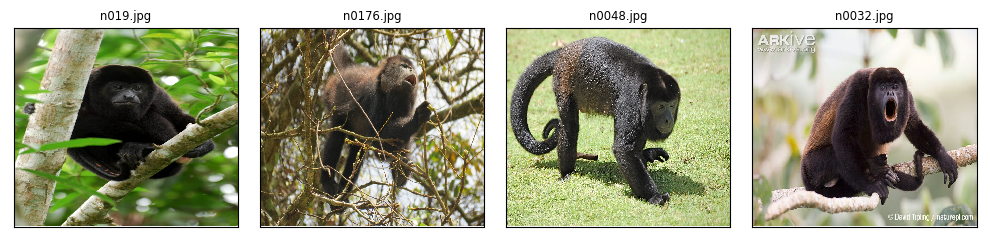


-------------------------------------------------------Patas Monkey-------------------------------------------------------


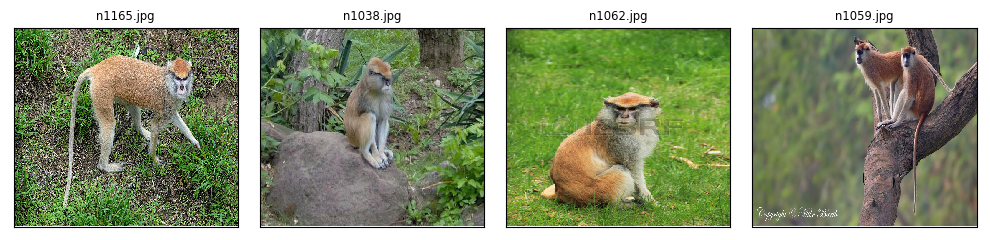


-------------------------------------------------------Bald Uakari-------------------------------------------------------


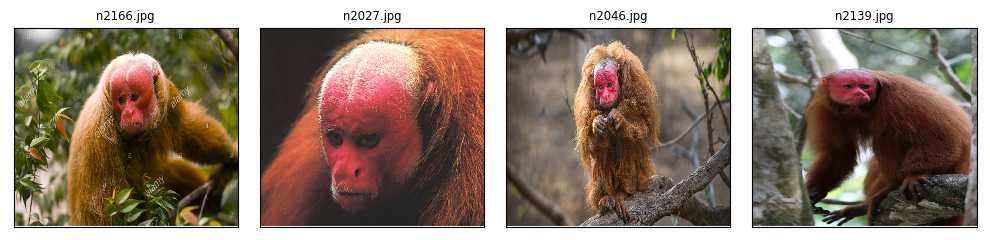


-------------------------------------------------------Japanese Macaque-------------------------------------------------------


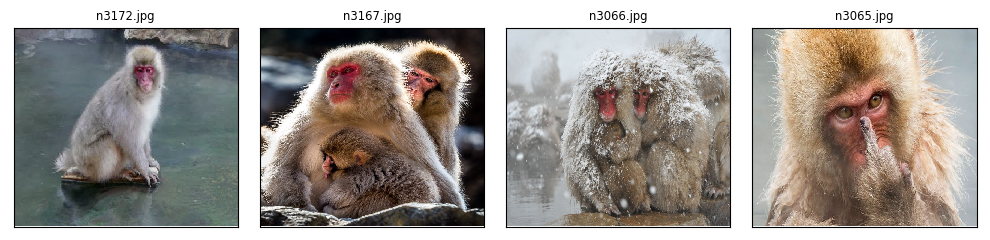


-------------------------------------------------------Pygmy Marmoset-------------------------------------------------------


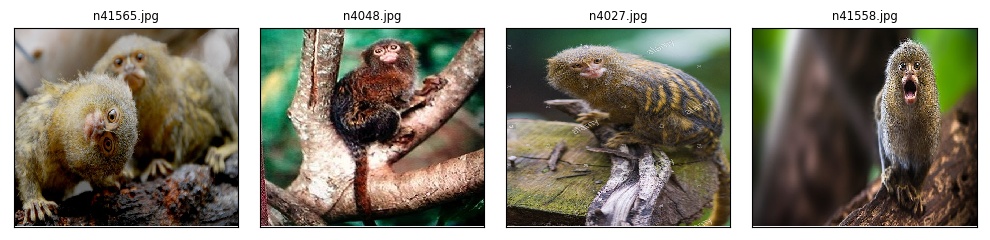


-------------------------------------------------------White Headed Capuchin-------------------------------------------------------


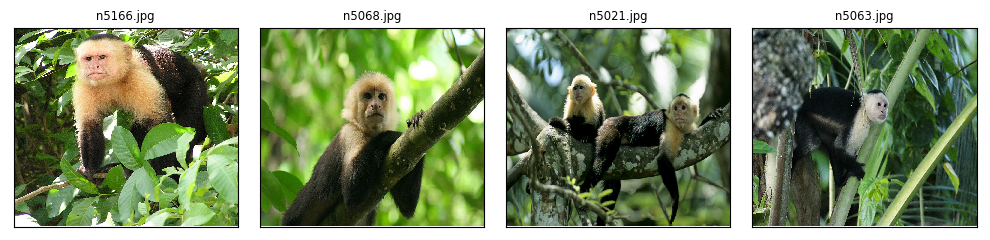


-------------------------------------------------------Silvery Marmoset-------------------------------------------------------


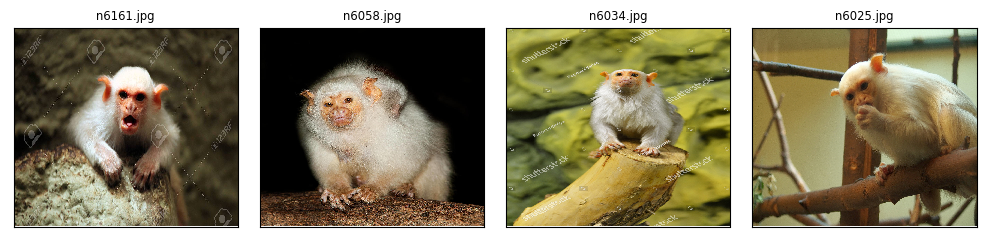


-------------------------------------------------------Common Squirrel Monkey-------------------------------------------------------


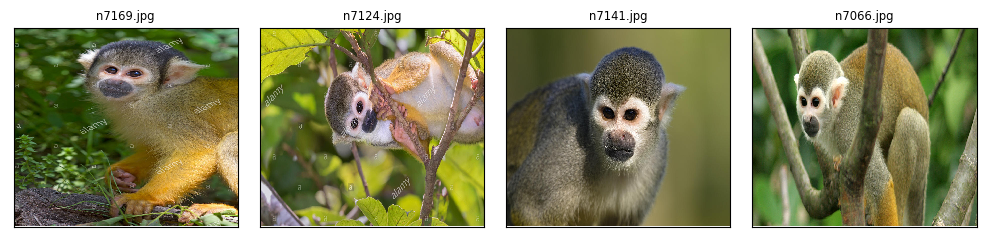


-------------------------------------------------------Black Headed Night Monkey-------------------------------------------------------


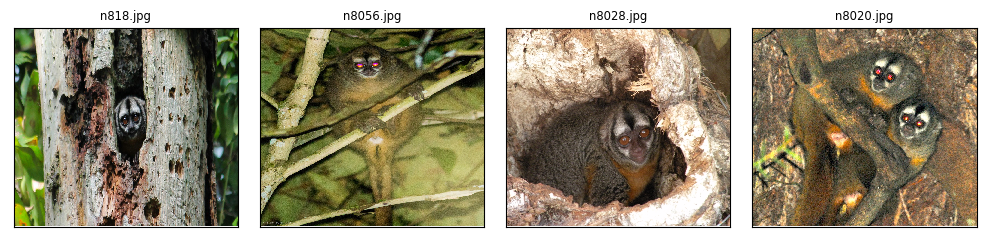


-------------------------------------------------------Nilgiri Langur-------------------------------------------------------


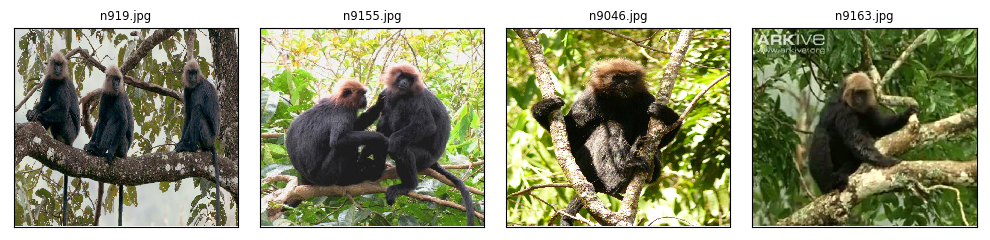


-------------------------------------------------------All Class Printed:10-------------------------------------------------------


In [42]:
show_class_sample_images(training_dir, image_count_per_category=4, save=False, dpi=100, update_image=False, name_map=monkey_labels_common)

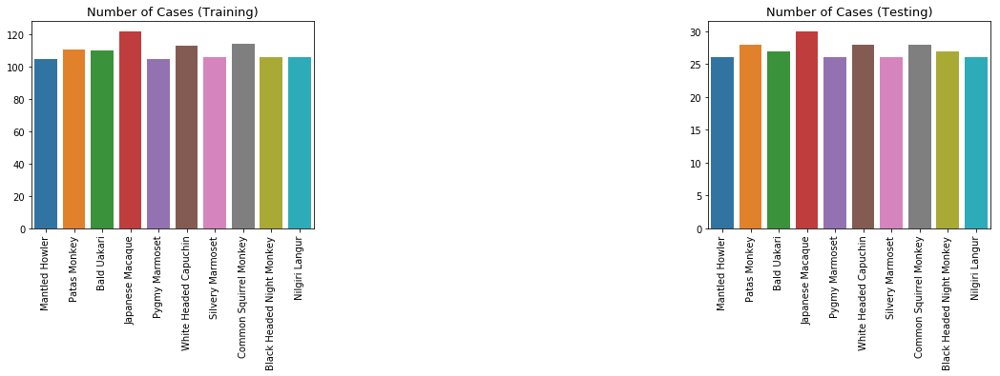

In [43]:
plot_params = get_reset_plot_params()

plot_params['figsize'] = (18,4)

plot_params['title_fontsize'] = 13
plot_params['label_fontsize'] = 10

plot_params['title'] = "Number of Cases"

plot_params['subplot'] = 131

show_train_val_test(training_dir, validation_dir=None, testing_dir=testing_dir, plot_params=plot_params, name_map=monkey_labels_common)

classes = os.listdir(training_dir)
classes = [name_correct(i) for i in classes]



### Image Preprocessing/ Augmentation/ Transformation for Training, Validation, Testing and  Dataset 

In [141]:
# batch_size = 32

# target_size = (299, 299)
# color_mode = "rgb"


rescale = 1./255
# target_size = (150, 150)
target_size = (299, 299)
batch_size = 64
class_mode = "categorical"
# class_mode = "binary"



train_datagen = ImageDataGenerator(
    rescale=rescale,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.15)


train_generator = train_datagen.flow_from_directory(
    training_dir,
    target_size=target_size,
    class_mode=class_mode,
    batch_size=batch_size,
    subset='training',
    shuffle=True)


# validation_datagen = ImageDataGenerator(rescale=rescale)

validation_generator = train_datagen.flow_from_directory(
    training_dir,
    target_size=target_size,
    class_mode=class_mode,
    batch_size=batch_size,
    subset='validation',
    shuffle = False)



# no test data so use validation data as test data

test_datagen = ImageDataGenerator(rescale=rescale)

test_generator = test_datagen.flow_from_directory(
    testing_dir,
    target_size=target_size,
    class_mode=class_mode,
    batch_size=1,
    shuffle = False)

Found 939 images belonging to 10 classes.
Found 158 images belonging to 10 classes.
Found 272 images belonging to 10 classes.


In [50]:
from sklearn.utils import class_weight
def get_weight(y):
    class_weight_current =  class_weight.compute_class_weight('balanced', np.unique(y), y)
    return class_weight_current

###  Training Files Configuration

In [51]:
class_weight = get_weight(train_generator.classes)
class_weight

array([1.04333333, 0.98842105, 0.99893617, 0.90288462, 1.04333333,
       0.96804124, 1.03186813, 0.96804124, 1.03186813, 1.04333333])

In [54]:
main_model_dir = output_directory + r"models/"
main_log_dir = output_directory + r"logs/"


clear_directory(main_log_dir)
remove_empty_folders(main_model_dir, False)


model_dir = main_model_dir + time.strftime('%Y-%m-%d %H-%M-%S') + "/"
log_dir = main_log_dir + time.strftime('%Y-%m-%d %H-%M-%S')

create_directory(model_dir, remove=True)
create_directory(log_dir, remove=True)

model_file = model_dir + "{epoch:02d}-val_acc-{val_acc:.2f}-val_loss-{val_loss:.2f}.hdf5"

[WinError 5] Access is denied: 'data/output/logs/2018-12-18 02-37-20\\events.out.tfevents.1545118699.DESKTOP-BU5QMIC'
Removing empty folder: data/output/models/2018-12-18 02-49-33


### Callbacks 

In [62]:
reset_graph()
reset_callbacks()

In [63]:
print("Settting Callbacks at ", date_time(1))

checkpoint = ModelCheckpoint(
    model_file, 
    monitor='val_acc', 
    save_best_only=True)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=20,
    verbose=1,
    restore_best_weights=True)


tensorboard = TensorBoard(
    log_dir=log_dir,
    batch_size=batch_size,
    update_freq = 'batch')


reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    patience=5,
    cooldown=0,
    min_lr=0.00000001,
    verbose=1)


#-----------------------------------------------------------------------------------------------------------------#
callbacks = [checkpoint, reduce_lr, early_stopping, tensorboard]
# callbacks = [checkpoint, tensorboard]
#-----------------------------------------------------------------------------------------------------------------#
print("Set Callbacks at ", date_time(1))

Settting Callbacks at  Timestamp: 2018-12-18 02:51:17
Set Callbacks at  Timestamp: 2018-12-18 02:51:17


In [64]:
def get_conv_model():
    model = Sequential()
    model.add(Conv2D(16, (3, 3), activation='relu', padding="same", input_shape=(3,150,150)))
    model.add(Conv2D(16, (3, 3), padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(32, (3, 3), activation='relu', padding="same", input_shape=(3,150,150)))
    model.add(Conv2D(32, (3, 3), padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
    model.add(Conv2D(64, (3, 3), padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(96, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
    model.add(Conv2D(96, (3, 3), padding="valid", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
    model.add(Conv2D(128, (3, 3), padding="valid", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())

    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(2 , activation='softmax'))


    print(model.summary())
    
    return model

In [65]:
# Load and configure model InceptionV3 for fine-tuning with new class labels
def get_model():    
    
    base_model = InceptionV3(weights='imagenet', include_top=False)
#     base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

    x = base_model.output
    
    x = Dropout(0.5)(x)
    
    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation='relu')(x)
#     x = Dense(256, activation='relu')(x)
    
    x = BatchNormalization()(x)
    
    predictions = Dense(10, activation='softmax')(x) 
    
    
    model = Model(inputs=base_model.input, outputs=predictions)
    
    
    for layer in base_model.layers:
        layer.trainable = False
        
        
    for layer in model.layers[:249]:
        layer.trainable = False
    for layer in model.layers[249:]:
        layer.trainable = True
        
    
    model.summary()
        
    return model

### Training/Fine-Tuning Base Model-InceptionV3 for Fine-Tuning with New Class Labels

In [66]:
print("Getting Base Model", date_time(1))
model = get_model()
# model = get_conv_model()
# model = keras.models.load_model("data/output/models/2018-12-15 00-26-45/13-val_acc-0.70-val_loss-0.58.hdf5")

Getting Base Model Timestamp: 2018-12-18 02:51:21
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, None, None, 3 0           batch_normalization_1[0][0]      
___________________________________________________________

__________________________________________________________________________________________________
mixed0 (Concatenate)            (None, None, None, 2 0           activation_6[0][0]               
                                                                 activation_8[0][0]               
                                                                 activation_11[0][0]              
                                                                 activation_12[0][0]              
__________________________________________________________________________________________________
conv2d_16 (Conv2D)              (None, None, None, 6 16384       mixed0[0][0]                     
__________________________________________________________________________________________________
batch_normalization_16 (BatchNo (None, None, None, 6 192         conv2d_16[0][0]                  
__________________________________________________________________________________________________
activation

__________________________________________________________________________________________________
batch_normalization_20 (BatchNo (None, None, None, 6 192         conv2d_20[0][0]                  
__________________________________________________________________________________________________
batch_normalization_22 (BatchNo (None, None, None, 6 192         conv2d_22[0][0]                  
__________________________________________________________________________________________________
batch_normalization_25 (BatchNo (None, None, None, 9 288         conv2d_25[0][0]                  
__________________________________________________________________________________________________
batch_normalization_26 (BatchNo (None, None, None, 6 192         conv2d_26[0][0]                  
__________________________________________________________________________________________________
activation_20 (Activation)      (None, None, None, 6 0           batch_normalization_20[0][0]     
__________

batch_normalization_38 (BatchNo (None, None, None, 1 384         conv2d_38[0][0]                  
__________________________________________________________________________________________________
activation_33 (Activation)      (None, None, None, 1 0           batch_normalization_33[0][0]     
__________________________________________________________________________________________________
activation_38 (Activation)      (None, None, None, 1 0           batch_normalization_38[0][0]     
__________________________________________________________________________________________________
average_pooling2d_4 (AveragePoo (None, None, None, 7 0           mixed3[0][0]                     
__________________________________________________________________________________________________
conv2d_31 (Conv2D)              (None, None, None, 1 147456      mixed3[0][0]                     
__________________________________________________________________________________________________
conv2d_34 

__________________________________________________________________________________________________
batch_normalization_41 (BatchNo (None, None, None, 1 576         conv2d_41[0][0]                  
__________________________________________________________________________________________________
batch_normalization_44 (BatchNo (None, None, None, 1 576         conv2d_44[0][0]                  
__________________________________________________________________________________________________
batch_normalization_49 (BatchNo (None, None, None, 1 576         conv2d_49[0][0]                  
__________________________________________________________________________________________________
batch_normalization_50 (BatchNo (None, None, None, 1 576         conv2d_50[0][0]                  
__________________________________________________________________________________________________
activation_41 (Activation)      (None, None, None, 1 0           batch_normalization_41[0][0]     
__________

activation_60 (Activation)      (None, None, None, 1 0           batch_normalization_60[0][0]     
__________________________________________________________________________________________________
mixed6 (Concatenate)            (None, None, None, 7 0           activation_51[0][0]              
                                                                 activation_54[0][0]              
                                                                 activation_59[0][0]              
                                                                 activation_60[0][0]              
__________________________________________________________________________________________________
conv2d_65 (Conv2D)              (None, None, None, 1 147456      mixed6[0][0]                     
__________________________________________________________________________________________________
batch_normalization_65 (BatchNo (None, None, None, 1 576         conv2d_65[0][0]                  
__________

batch_normalization_74 (BatchNo (None, None, None, 1 576         conv2d_74[0][0]                  
__________________________________________________________________________________________________
activation_74 (Activation)      (None, None, None, 1 0           batch_normalization_74[0][0]     
__________________________________________________________________________________________________
conv2d_71 (Conv2D)              (None, None, None, 1 147456      mixed7[0][0]                     
__________________________________________________________________________________________________
conv2d_75 (Conv2D)              (None, None, None, 1 258048      activation_74[0][0]              
__________________________________________________________________________________________________
batch_normalization_71 (BatchNo (None, None, None, 1 576         conv2d_71[0][0]                  
__________________________________________________________________________________________________
batch_norm

activation_84 (Activation)      (None, None, None, 3 0           batch_normalization_84[0][0]     
__________________________________________________________________________________________________
batch_normalization_85 (BatchNo (None, None, None, 1 576         conv2d_85[0][0]                  
__________________________________________________________________________________________________
activation_77 (Activation)      (None, None, None, 3 0           batch_normalization_77[0][0]     
__________________________________________________________________________________________________
mixed9_0 (Concatenate)          (None, None, None, 7 0           activation_79[0][0]              
                                                                 activation_80[0][0]              
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, None, None, 7 0           activation_83[0][0]              
          

                                                                 mixed9_1[0][0]                   
                                                                 concatenate_2[0][0]              
                                                                 activation_94[0][0]              
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, None, None, 2 0           mixed10[0][0]                    
__________________________________________________________________________________________________
global_average_pooling2d_1 (Glo (None, 2048)         0           dropout_1[0][0]                  
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 1024)         2098176     global_average_pooling2d_1[0][0] 
__________________________________________________________________________________________________
batch_norm

In [67]:
print("Starting Trainning Model", date_time(1))


steps_per_epoch=len(train_generator)
validation_steps=len(validation_generator)



# lr = 0.000005
# optimizer=optimizers.Adam(lr=lr)



optimizer=optimizers.Adam()
loss='categorical_crossentropy'
metrics=['accuracy']
epochs = 100


model.compile(optimizer, loss=loss, metrics=metrics)




history = model.fit_generator(
    train_generator,
    steps_per_epoch = steps_per_epoch,
    epochs=epochs,
    verbose=1,
    callbacks=callbacks,
    validation_data=validation_generator,
    validation_steps=validation_steps, 
    class_weight=class_weight)

print("Completed Model Trainning", date_time(1))


Starting Trainning Model Timestamp: 2018-12-18 02:51:36
Epoch 1/100
15/15 [==============================] - ETA: 2:52 - loss: 3.1098 - acc: 0.093 - ETA: 1:25 - loss: 2.0624 - acc: 0.382 - ETA: 56s - loss: 1.5673 - acc: 0.541 - ETA: 41s - loss: 1.2040 - acc: 0.64 - ETA: 38s - loss: 1.0053 - acc: 0.70 - ETA: 41s - loss: 0.8816 - acc: 0.74 - ETA: 39s - loss: 0.7876 - acc: 0.77 - ETA: 33s - loss: 0.7513 - acc: 0.78 - ETA: 28s - loss: 0.6885 - acc: 0.80 - ETA: 22s - loss: 0.6369 - acc: 0.82 - ETA: 17s - loss: 0.5917 - acc: 0.83 - ETA: 13s - loss: 0.5512 - acc: 0.84 - ETA: 8s - loss: 0.5157 - acc: 0.8546 - ETA: 4s - loss: 0.5224 - acc: 0.860 - 73s 5s/step - loss: 0.4968 - acc: 0.8681 - val_loss: 0.5653 - val_acc: 0.9051
Epoch 2/100
15/15 [==============================] - ETA: 11s - loss: 0.1074 - acc: 0.96 - ETA: 12s - loss: 0.0619 - acc: 0.97 - ETA: 11s - loss: 0.0484 - acc: 0.98 - ETA: 10s - loss: 0.0600 - acc: 0.97 - ETA: 9s - loss: 0.0580 - acc: 0.9750 - ETA: 8s - loss: 0.0644 - acc: 0

15/15 [==============================] - ETA: 13s - loss: 4.8948e-04 - acc: 1.00 - ETA: 26s - loss: 2.7140e-04 - acc: 1.00 - ETA: 31s - loss: 0.0021 - acc: 1.0000   - ETA: 30s - loss: 0.0019 - acc: 1.00 - ETA: 28s - loss: 0.0020 - acc: 1.00 - ETA: 25s - loss: 0.0017 - acc: 1.00 - ETA: 23s - loss: 0.0016 - acc: 1.00 - ETA: 20s - loss: 0.0050 - acc: 0.99 - ETA: 16s - loss: 0.0044 - acc: 0.99 - ETA: 13s - loss: 0.0040 - acc: 0.99 - ETA: 11s - loss: 0.0038 - acc: 0.99 - ETA: 8s - loss: 0.0035 - acc: 0.9987 - ETA: 5s - loss: 0.0033 - acc: 0.998 - ETA: 2s - loss: 0.0031 - acc: 0.998 - 43s 3s/step - loss: 0.0037 - acc: 0.9990 - val_loss: 0.0431 - val_acc: 0.9810
Epoch 14/100
15/15 [==============================] - ETA: 11s - loss: 3.7772e-04 - acc: 1.00 - ETA: 27s - loss: 0.0151 - acc: 0.9844   - ETA: 26s - loss: 0.0107 - acc: 0.98 - ETA: 29s - loss: 0.0100 - acc: 0.99 - ETA: 26s - loss: 0.0082 - acc: 0.99 - ETA: 24s - loss: 0.0069 - acc: 0.99 - ETA: 21s - loss: 0.0068 - acc: 0.99 - ETA: 18s

15/15 [==============================] - ETA: 37s - loss: 2.4990e-04 - acc: 1.00 - ETA: 40s - loss: 2.5000e-04 - acc: 1.00 - ETA: 36s - loss: 2.0744e-04 - acc: 1.00 - ETA: 32s - loss: 1.9548e-04 - acc: 1.00 - ETA: 28s - loss: 3.9987e-04 - acc: 1.00 - ETA: 25s - loss: 0.0010 - acc: 1.0000   - ETA: 23s - loss: 0.0013 - acc: 1.00 - ETA: 20s - loss: 0.0012 - acc: 1.00 - ETA: 17s - loss: 0.0011 - acc: 1.00 - ETA: 14s - loss: 0.0011 - acc: 1.00 - ETA: 11s - loss: 9.8452e-04 - acc: 1.00 - ETA: 8s - loss: 9.1420e-04 - acc: 1.0000 - ETA: 5s - loss: 0.0011 - acc: 1.0000    - ETA: 2s - loss: 0.0011 - acc: 1.000 - 44s 3s/step - loss: 0.0010 - acc: 1.0000 - val_loss: 0.1065 - val_acc: 0.9684
Epoch 25/100
15/15 [==============================] - ETA: 14s - loss: 3.1249e-04 - acc: 1.00 - ETA: 32s - loss: 1.9051e-04 - acc: 1.00 - ETA: 32s - loss: 1.4649e-04 - acc: 1.00 - ETA: 32s - loss: 1.7541e-04 - acc: 1.00 - ETA: 29s - loss: 1.5910e-04 - acc: 1.00 - ETA: 26s - loss: 1.7084e-04 - acc: 1.00 - ETA: 2

### Model Performance Visualization over the Epochs

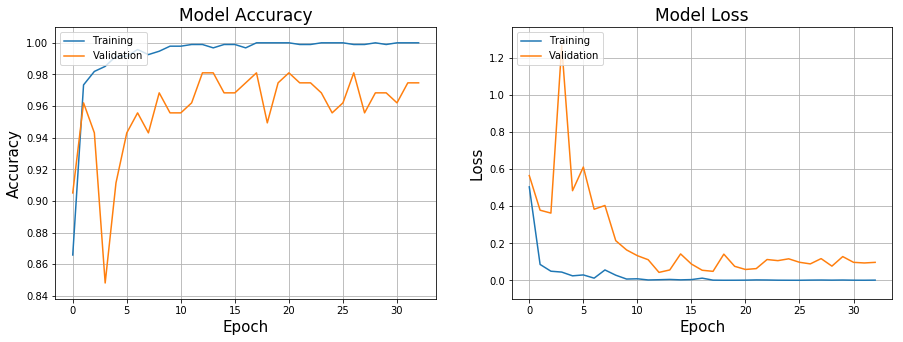

In [68]:
xlabel = 'Epoch'
legends = ['Training', 'Validation']

ylim_pad = [0.01, 0.1]


plt.figure(figsize=(15, 5))

# Plot training & validation Accuracy values

y1 = history.history['acc']
y2 = history.history['val_acc']

min_y = min(min(y1), min(y2))-ylim_pad[0]
max_y = max(max(y1), max(y2))+ylim_pad[0]


plt.subplot(121)

plt.plot(y1)
plt.plot(y2)

plt.title('Model Accuracy', fontsize=17)
plt.xlabel(xlabel, fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
plt.ylim(min_y, max_y)
plt.legend(legends, loc='upper left')
plt.grid()

                         
# Plot training & validation loss values
    
y1 = history.history['loss']
y2 = history.history['val_loss']

min_y = min(min(y1), min(y2))-ylim_pad[1]
max_y = max(max(y1), max(y2))+ylim_pad[1]
    
    
plt.subplot(122)

plt.plot(y1)
plt.plot(y2)

plt.title('Model Loss', fontsize=17)
plt.xlabel(xlabel, fontsize=15)
plt.ylabel('Loss', fontsize=15)
plt.ylim(min_y, max_y)
plt.legend(legends, loc='upper left')
plt.grid()
                         
plt.show()

### Test Saved Models

In [136]:
dir_name = r"data/output/models/"
dirs = os.listdir(dir_name)
for i in range(len(dirs)):
    print(i, dirs[i])

0 09-val_acc-0.86-val_loss-0.93.hdf5
1 10-val_acc-0.87-val_loss-0.68.hdf5
2 11-val_acc-0.89-val_loss-0.49.hdf5
3 12-val_acc-0.91-val_loss-0.46.hdf5
4 13-val_acc-0.92-val_loss-0.39.hdf5
5 14-val_acc-0.93-val_loss-0.34.hdf5
6 15-val_acc-0.93-val_loss-0.30.hdf5
7 16-val_acc-0.95-val_loss-0.26.hdf5
8 17-val_acc-0.96-val_loss-0.20.hdf5
9 18-val_acc-0.96-val_loss-0.19.hdf5
10 19-val_acc-0.94-val_loss-0.25.hdf5
11 20-val_acc-0.94-val_loss-0.28.hdf5
12 2018-12-18 02-49-37
13 21-val_acc-0.94-val_loss-0.22.hdf5
14 22-val_acc-0.95-val_loss-0.17.hdf5
15 23-val_acc-0.96-val_loss-0.13.hdf5
16 24-val_acc-0.96-val_loss-0.13.hdf5
17 25-val_acc-0.96-val_loss-0.12.hdf5
18 26-val_acc-0.97-val_loss-0.12.hdf5
19 27-val_acc-0.97-val_loss-0.11.hdf5
20 28-val_acc-0.96-val_loss-0.12.hdf5
21 29-val_acc-0.96-val_loss-0.14.hdf5
22 30-val_acc-0.95-val_loss-0.15.hdf5
23 31-val_acc-0.93-val_loss-0.23.hdf5
24 32-val_acc-0.93-val_loss-0.24.hdf5
25 33-val_acc-0.92-val_loss-0.26.hdf5
26 34-val_acc-0.93-val_loss-0.25.hdf5

In [137]:
cur_dir =dir_name+dirs[12]+"/"
model_names = os.listdir(cur_dir)
for i in range(len(model_names)):
    print(i, model_names[i])

0 01-val_acc-0.91-val_loss-0.57.hdf5
1 02-val_acc-0.96-val_loss-0.38.hdf5
2 09-val_acc-0.97-val_loss-0.21.hdf5
3 13-val_acc-0.98-val_loss-0.04.hdf5
4 14-val_acc-0.98-val_loss-0.06.hdf5


In [168]:
model_file = cur_dir+model_names[3]

print(model_file)

data/output/models/2018-12-18 02-49-37/13-val_acc-0.98-val_loss-0.04.hdf5


In [169]:
model = keras.models.load_model(model_file)

In [170]:
print("Results")

result  = model.evaluate_generator(test_generator, steps=len(test_generator), verbose=2)
print("-"*90)
print("%s%.2f  "% ("Loss     : ", result[0]))
print("%s%.2f%s"% ("Accuracy : ", result[1]*100, "%"))

Results
------------------------------------------------------------------------------------------
Loss     : 0.03  
Accuracy : 98.53%


In [180]:
print("Results")
y_pred = model.predict_generator(test_generator, steps=len(test_generator), verbose=2)  
y_pred2 = y_pred.argmax(axis=-1)
y_true=test_generator.classes

Results


In [181]:
for i in range(len(y_true)):
    if(y_true[i]!=y_pred2[i]):
        print(i, y_true[i], y_pred2[i], test_generator.filenames[i])

0 0 1 n0\n000.jpg
1 0 1 n0\n001.jpg
2 0 1 n0\n0010.jpg
3 0 1 n0\n0011.jpg
4 0 1 n0\n0012.jpg
5 0 1 n0\n0013.jpg
6 0 1 n0\n0014.jpg
7 0 1 n0\n0015.jpg
8 0 1 n0\n0016.jpg
9 0 1 n0\n0017.jpg
10 0 1 n0\n002.jpg
11 0 1 n0\n003.jpg
12 0 1 n0\n004.jpg
13 0 1 n0\n005.jpg
14 0 1 n0\n006.jpg
15 0 1 n0\n007.jpg
16 0 1 n0\n008.jpg
17 0 1 n0\n009.jpg
18 0 2 n0\n010.jpg
19 0 2 n0\n011.jpg
20 0 2 n0\n012.jpg
21 0 2 n0\n013.jpg
22 0 2 n0\n014.jpg
23 0 2 n0\n015.jpg
24 0 2 n0\n016.jpg
25 0 2 n0\n017.jpg
26 1 2 n1\n100.jpg
27 1 2 n1\n101.jpg
28 1 2 n1\n1010.jpg
29 1 2 n1\n1011.jpg
30 1 2 n1\n1012.jpg
31 1 2 n1\n1013.jpg
32 1 2 n1\n1014.jpg
33 1 2 n1\n1015.jpg
34 1 2 n1\n1016.jpg
35 1 2 n1\n102.jpg
36 1 2 n1\n103.jpg
37 1 2 n1\n104.jpg
38 1 2 n1\n105.jpg
39 1 2 n1\n106.jpg
40 1 2 n1\n107.jpg
41 1 2 n1\n108.jpg
42 1 2 n1\n109.jpg
43 1 2 n1\n110.jpg
44 1 2 n1\n111.jpg
45 1 3 n1\n112.jpg
46 1 3 n1\n113.jpg
47 1 3 n1\n114.jpg
48 1 3 n1\n115.jpg
49 1 3 n1\n116.jpg
50 1 3 n1\n117.jpg
51 1 3 n1\n118.jpg
52 1 3 

In [178]:
classes = test_generator.class_indices
classes = [name_correct(monkey_labels_common[i]) for i in monkey_labels_common]
classes

['Mantled Howler',
 'Patas Monkey',
 'Bald Uakari',
 'Japanese Macaque',
 'Pygmy Marmoset',
 'White Headed Capuchin',
 'Silvery Marmoset',
 'Common Squirrel Monkey',
 'Black Headed Night Monkey',
 'Nilgiri Langur']

------------------------------------------------------------------------------------------
Derived Report
------------------------------------------------------------------------------------------
Precision     : 8.10%
Recall        : 8.09%
F1-Score      : 8.09%
------------------------------------------------------------------------------------------





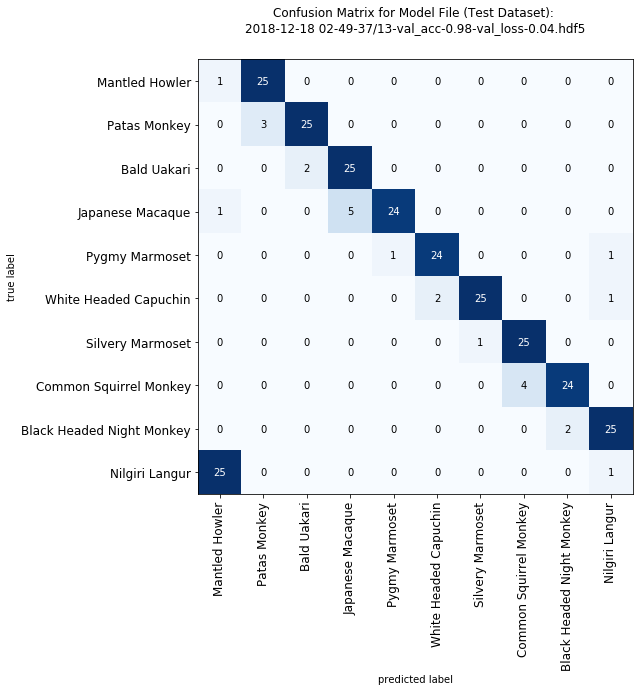




------------------------------------------------------------------------------------------
Report for Model File:  2018-12-18 02-49-37/13-val_acc-0.98-val_loss-0.04.hdf5
------------------------------------------------------------------------------------------
                           precision    recall  f1-score   support

           Mantled Howler       0.04      0.04      0.04        26
             Patas Monkey       0.11      0.11      0.11        28
              Bald Uakari       0.07      0.07      0.07        27
         Japanese Macaque       0.17      0.17      0.17        30
           Pygmy Marmoset       0.04      0.04      0.04        26
    White Headed Capuchin       0.08      0.07      0.07        28
         Silvery Marmoset       0.04      0.04      0.04        26
   Common Squirrel Monkey       0.14      0.14      0.14        28
Black Headed Night Monkey       0.08      0.07      0.08        27
           Nilgiri Langur       0.04      0.04      0.04        2

In [179]:
image_file_name_CM = figure_directory+"/CM"

title = model_file.split("/")
model_title = "/".join([i for i in title[3:]])

precision = precision_score(y_true, y_pred, average="weighted") 
recall = recall_score(y_true, y_pred, average="weighted") 
f1 = f1_score(y_true, y_pred, average="weighted") 

print("-"*90)
print("Derived Report")
print("-"*90)
print("%s%.2f%s"% ("Precision     : ", precision*100, "%"))
print("%s%.2f%s"% ("Recall        : ", recall*100,    "%"))
print("%s%.2f%s"% ("F1-Score      : ", f1*100,        "%"))
print("-"*90)
print("\n\n")

CM = confusion_matrix(y_true, y_pred)

fig, ax = plot_confusion_matrix(conf_mat=CM , figsize=(10,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.xticks(range(len(classes)), classes, fontsize=12)
plt.xticks(rotation=90)
plt.yticks(range(len(classes)), classes, fontsize=12)
plt.title("Confusion Matrix for Model File (Test Dataset): \n"+model_title, fontsize=12)
fig.savefig(image_file_name_CM, dpi=100)
plt.show()
    

cls_report_print = classification_report(y_true, y_pred, target_names=classes)

cls_report = classification_report(y_true, y_pred, target_names=classes, output_dict=True)

print("\n\n")
print("-"*90)
print("Report for Model File: ", model_title)
print("-"*90)
print(cls_report_print)
print("-"*90)


In [ ]:
numofbatch = len(test_generator)

batch_no = random.randint(0, numofbatch-1)

y_img_batch, y_true_batch = test_generator[batch_no] 
y_true_batch = y_true_batch.argmax(axis=-1)

y_pred_batch = model.predict(y_img_batch)
y_pred_batch = y_pred_batch.argmax(axis=-1)


sizeofbatch = len(y_true_batch)
print("-"*35)
print("%s%d"%     ("Selected Batch No       : ", batch_no))
print("-"*35)
print("%s%d"%     ("Batch Size              : ", len(y_pred_batch)))
print("-"*35)
print("%s%.2f%s"% ("Accuracy                : ", np.mean(y_true==y_pred)*100, "%"))
print("-"*35)

### Visualization

In [87]:
def show_predictions(test_generator, y_true, y_pred, subplot_params, plot_params, class_map, testing_dir, image_file_name, count=8, sample=True, name_map=None):
    fig, axs = get_fig_axs(subplot_params)
    plt.rcParams.update({'axes.titlesize': plot_params["axes.titlesize"]})
    plt.subplots_adjust(hspace=subplot_params["hspace"], wspace=subplot_params["wspace"])
    
    file_names = test_generator.filenames
    
    m = {}
    length = len(y_true)

    for i in range(0, count): 
        num = i
        if sample:
            num = random.randint(0, length-1)
            while num in m:
                num = int(random.randint(0, length-1))

            m[num]=1


        plt.subplot(subplot_params["nrows"], subplot_params["ncols"], i+1)
        img = plt.imread(testing_dir+"\\"+ file_names[num])
        plt.imshow(img, aspect='auto')

        plt.xticks([])
        plt.yticks([])
        
        
        original = class_map[y_true[num]]
        predicted = class_map[y_pred[num]]
        
        if name_map:
            title_text = ("%s%s%s%s%s"%("True: ", name_correct(name_map[original]), "\n", "Pred: ", name_correct(name_map[predicted])))
        else:
            title_text = ("%s%s%s%s%s"%("True: ", name_correct(original), "\n", "Pred: ", name_correct(predicted)))
        
        if original==predicted:
            plt.title(title_text)
        else:
            plt.title(title_text, color='red')
            

        if plot_params["update_image"] and os.path.exists(image_file_name):
            os.remove(image_file_name)   

        fig.savefig(image_file_name, dpi=subplot_params["dpi"])

    plt.tight_layout()
    plt.show()



### Visualization

In [88]:
image_file_name_batch = figure_directory+"/result"
image_file_name_sample = figure_directory+"/sample"

# batch_size_t = len(y_true_batch)

class_map = {v: k for k, v in test_generator.class_indices.items()}


dpi=100


ncols = 8
# ncols = batch_size_t if batch_size_t<ncols else ncols     
# nrows = batch_size_t/ncols
# nrows = int(batch_size_t/ncols)+1 if batch_size_t%ncols else  int(batch_size_t/ncols)
nrows = 4

count = ncols*nrows


subplot_params = get_reset_subplot_params(nrows, ncols, dpi)
plot_params = get_reset_plot_params()


#### Visualization 1 (Random Batch)
Visualization of performance of a random test dataset batch

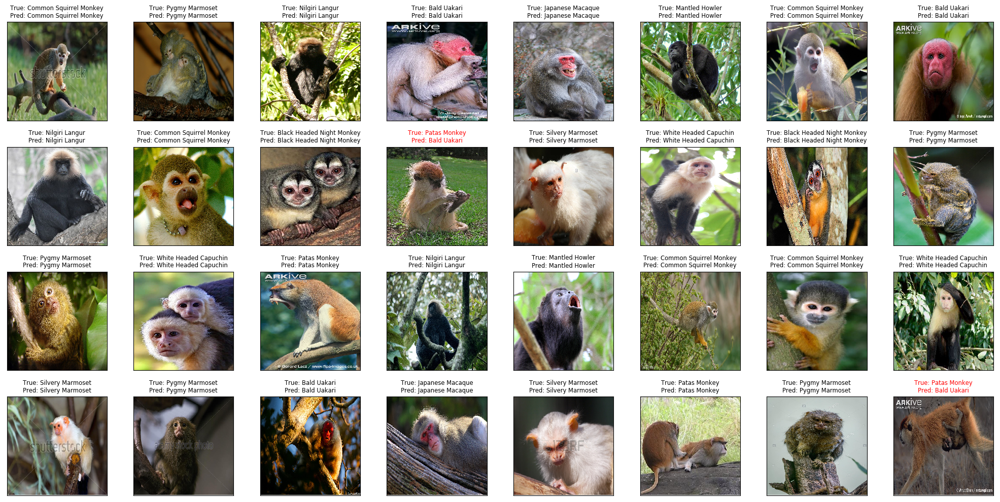

In [89]:
show_predictions(test_generator, y_true, y_pred, subplot_params, plot_params, class_map, testing_dir, image_file_name_batch, count=count, sample=True, name_map=monkey_labels_common)

#### Visualization 2 (Random) 
Visualization of performance of a few random images from a random batch

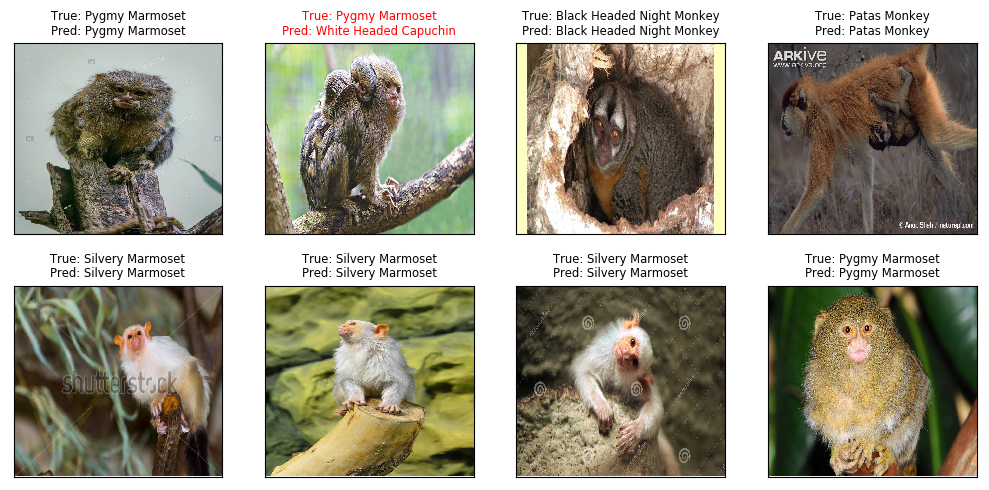

In [90]:
ncols = 4
nrows = 2

# if batch_size_t<4:
#     cols = 1
    
count = ncols*nrows
    

subplot_params = get_reset_subplot_params(nrows, ncols, dpi)
plot_params = get_reset_plot_params()


show_predictions(test_generator, y_true, y_pred, subplot_params, plot_params, class_map, testing_dir, image_file_name_sample, count=count, sample=True, name_map=monkey_labels_common)